<a href="https://colab.research.google.com/github/leonardodarrainrocha/doogbreedclassificationproject/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class dog breed classification using TensorFlow and TensorFlow Hub

## 1. Problem
Identifying a dog's breed from an image

## 2. Data
The data is used from Kaggle's dog breed identification competition
https://www.kaggle.com/competitions/dog-breed-identification/overview

## 3. Evaluation
File with prediction probabilities for each dog breed of each test image
https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features
Unstructured data in image format for 120 dog breeds
There are 10,000+ images in the train set (labels)
There are 10,000+ images in the test set  (no labels)

In [182]:
# Unzip the file from here, I have already done in the google drive directly, faster, do not consume resources here
# !unzip "/content/drive/MyDrive/data/dog-breed-identification.zip" -d "/content/drive/MyDrive/data/"

### Get our workspace ready

In [183]:
import tensorflow as tf
print("TF version: ", tf.__version__)

TF version:  2.18.0


In [278]:
import tensorflow_hub as hub
print("TF Hub version: ", hub.__version__)

TF Hub version:  0.16.1


In [185]:
# Runtime > Change runtime type

In [186]:
tf.config.list_physical_devices("GPU")

[]

## Getting our data ready (turning into Tensors)

In [187]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/data/dog-breed-identification/labels.csv")
labels_csv

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [188]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


In [189]:
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


<Axes: xlabel='breed'>

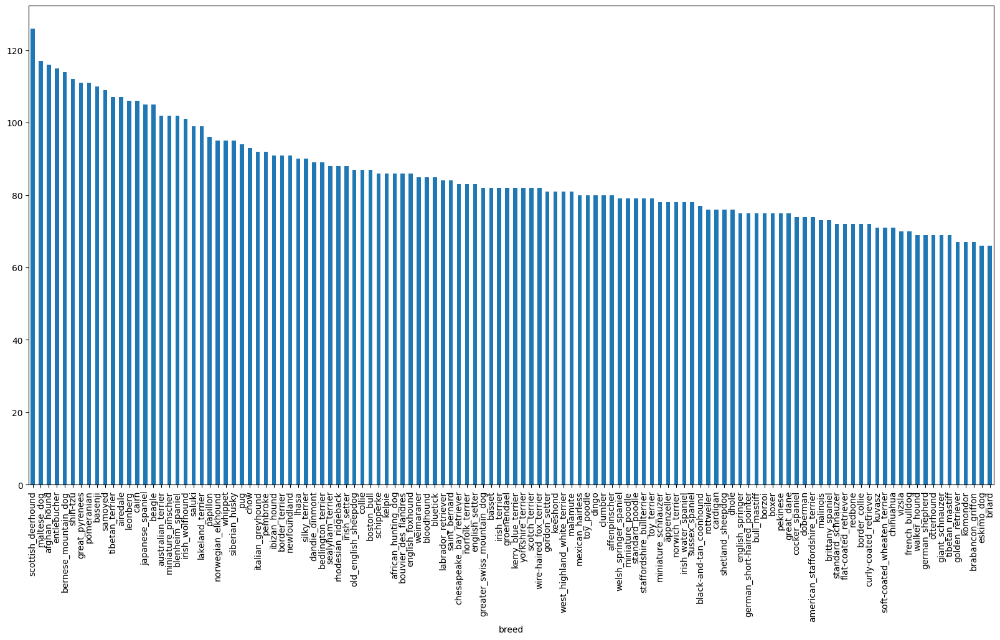

In [190]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [191]:
labels_csv["breed"].value_counts().median()

82.0

In [192]:
# optimum is 100 images per label and a minimum of 10

In [193]:
labels_csv[1:2]

,id,breed
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo


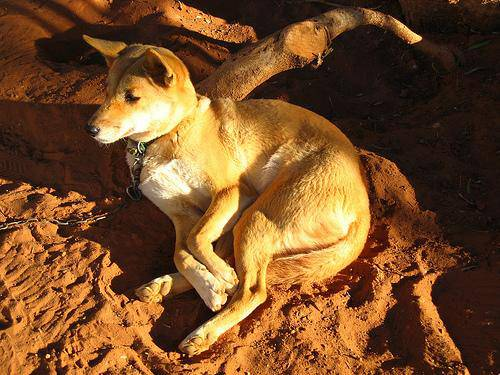

In [194]:
from IPython.display import Image
Image("/content/drive/MyDrive/data/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels
Lets's get a list of all of aur image file pathnames

In [195]:
filenames = ["/content/drive/MyDrive/data/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:5]

['/content/drive/MyDrive/data/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/data/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/data/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/data/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/data/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [196]:
import os
if len(os.listdir("/content/drive/MyDrive/data/dog-breed-identification/train/")) == len(filenames):
  print("same")
else:
  print("different")

same


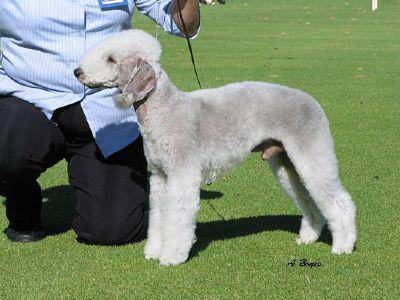

In [197]:
Image(filenames[300])

In [198]:
labels_csv["breed"][300]

'bedlington_terrier'

In [199]:
import numpy as np
np.random.seed(42)
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [200]:
len(labels)

10222

In [201]:
unique_breeds = np.unique(labels)
display(unique_breeds, len(unique_breeds))

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

120

In [202]:
missing = 0
for file in filenames:
  if os.path.isfile(file) == False:
    print(file)
    missing +=1
print(f"exist({120 - missing}) - missing({missing})")

exist(120) - missing(0)


In [203]:
boolean_labels = [label == unique_breeds for label in labels]
display(
    boolean_labels[0],
    boolean_labels[0].astype(int),
    np.where(unique_breeds == labels[0]),
    labels[0],
    len(boolean_labels), boolean_labels[0].argmax())

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

(array([19]),)

'boston_bull'

10222

np.int64(19)

### Creating our validation set
Since the dataset from Kaggle doesn't come with a validation set, we are going to create our own

In [204]:
X = filenames
y = boolean_labels

In [205]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [206]:
# We are going to create a validation dataset from training dataset using train_test_split
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], train_size=0.8, random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [207]:
X_train[:2], y_train[:2]

(['/content/drive/MyDrive/data/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/data/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
     

### Preprocess images (turning images into Tensors)
1. Take an image filepath
2. Use TensorFlow to read and save it into a variable
3. Turn image into Tensors
4. Normalize the image from integer between (0, 255) to float between (0, 1)
5. Resize the image
6. Return it

In [208]:
filenames[42]

'/content/drive/MyDrive/data/dog-breed-identification/train/011e06760794850c40f23d6426c40774.jpg'

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
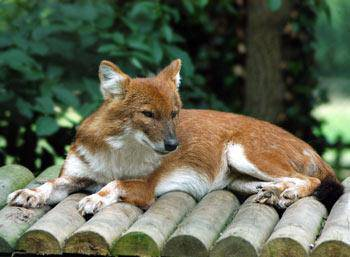

In [209]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image

array([[[ 30,  56,  43],
        [ 29,  57,  43],
        [ 35,  61,  48],
        ...,
        [  3,  12,   9],
        [  5,  20,  15],
        [  8,  25,  19]],

       [[ 33,  57,  44],
        [ 32,  56,  43],
        [ 35,  59,  46],
        ...,
        [  3,  14,  10],
        [  7,  22,  17],
        [  9,  29,  20]],

       [[ 35,  57,  45],
        [ 33,  55,  43],
        [ 32,  54,  42],
        ...,
        [  5,  16,  12],
        [ 10,  25,  18],
        [ 13,  33,  24]],

       ...,

       [[181, 183, 182],
        [189, 193, 192],
        [175, 177, 176],
        ...,
        [ 86, 102,  92],
        [ 77,  92,  85],
        [104, 121, 113]],

       [[183, 187, 186],
        [187, 193, 191],
        [166, 170, 169],
        ...,
        [ 63,  79,  68],
        [ 62,  78,  67],
        [ 97, 113, 103]],

       [[159, 165, 163],
        [173, 179, 177],
        [171, 177, 175],
        ...,
        [ 58,  72,  59],
        [ 59,  73,  60],
        [ 69,  85,  74]]], dtype=uint8)
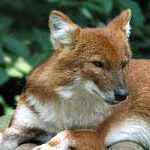

In [210]:
# Select only a section of the image
image[50:200, 50:200, :]

array([[ 89,  76,  63, ...,  77,  76,  76],
       [ 72,  67,  63, ...,  75,  74,  74],
       [ 56,  58,  64, ...,  71,  73,  74],
       ...,
       [  2,   5,   8, ..., 120, 126, 122],
       [  0,   2,   3, ..., 105, 112, 111],
       [ 16,  16,  15, ..., 101,  97, 120]], dtype=uint8)
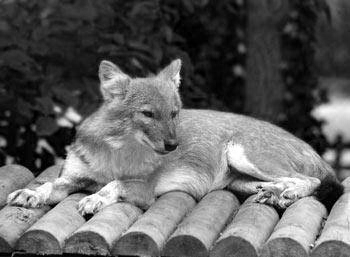

In [211]:
# Red (using gray scale of intensity)
image[:, :, 0]

In [212]:
print(image[:, :, 0])

[[ 89  76  63 ...  77  76  76]
 [ 72  67  63 ...  75  74  74]
 [ 56  58  64 ...  71  73  74]
 ...
 [  2   5   8 ... 120 126 122]
 [  0   2   3 ... 105 112 111]
 [ 16  16  15 ... 101  97 120]]


array([[137, 124, 111, ..., 133, 134, 134],
       [119, 114, 110, ..., 131, 132, 132],
       [104, 106, 112, ..., 127, 129, 130],
       ...,
       [ 11,  14,  14, ..., 113, 118, 114],
       [  3,   7,   9, ...,  98, 104, 103],
       [ 18,  19,  20, ...,  92,  88, 111]], dtype=uint8)
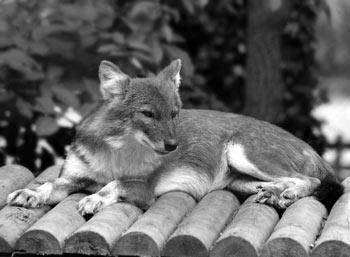

In [213]:
# Green (using gray scale of intensity)
image[:, :, 1]

In [214]:
print(image[:, :, 1])

[[137 124 111 ... 133 134 134]
 [119 114 110 ... 131 132 132]
 [104 106 112 ... 127 129 130]
 ...
 [ 11  14  14 ... 113 118 114]
 [  3   7   9 ...  98 104 103]
 [ 18  19  20 ...  92  88 111]]


array([[89, 76, 61, ..., 86, 86, 86],
       [75, 68, 64, ..., 84, 84, 84],
       [66, 68, 74, ..., 82, 84, 85],
       ...,
       [10, 11, 14, ..., 67, 71, 67],
       [ 7, 10,  7, ..., 54, 58, 57],
       [30, 24, 14, ..., 51, 47, 70]], dtype=uint8)
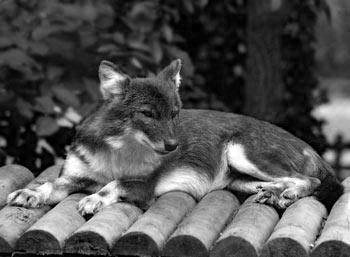

In [215]:
# Blue (using gray scale of intensity)
image[:, :, 2]

In [216]:
print(image[:, :, 2])

[[89 76 61 ... 86 86 86]
 [75 68 64 ... 84 84 84]
 [66 68 74 ... 82 84 85]
 ...
 [10 11 14 ... 67 71 67]
 [ 7 10  7 ... 54 58 57]
 [30 24 14 ... 51 47 70]]


array([[[ 89,   0,   0],
        [ 76,   0,   0],
        [ 63,   0,   0],
        ...,
        [ 77,   0,   0],
        [ 76,   0,   0],
        [ 76,   0,   0]],

       [[ 72,   0,   0],
        [ 67,   0,   0],
        [ 63,   0,   0],
        ...,
        [ 75,   0,   0],
        [ 74,   0,   0],
        [ 74,   0,   0]],

       [[ 56,   0,   0],
        [ 58,   0,   0],
        [ 64,   0,   0],
        ...,
        [ 71,   0,   0],
        [ 73,   0,   0],
        [ 74,   0,   0]],

       ...,

       [[  2,   0,   0],
        [  5,   0,   0],
        [  8,   0,   0],
        ...,
        [120,   0,   0],
        [126,   0,   0],
        [122,   0,   0]],

       [[  0,   0,   0],
        [  2,   0,   0],
        [  3,   0,   0],
        ...,
        [105,   0,   0],
        [112,   0,   0],
        [111,   0,   0]],

       [[ 16,   0,   0],
        [ 16,   0,   0],
        [ 15,   0,   0],
        ...,
        [101,   0,   0],
        [ 97,   0,   0],
        [120,   0,   0]]], dtype=uint8)
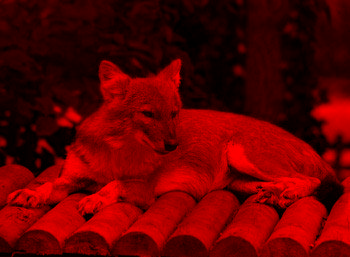

In [217]:
# If I want to see in a properly color I have to set the other two to 0 (I use a copy to do not modify the original one)
# Another way to display is using matplotlib:
# from matplotlib import pyplot as plt
# plt.imshow(red_copy)
red_copy =  image.copy()
red_copy[:, :, 1] = 0
red_copy[:, :, 2] = 0
red_copy

array([[[  0, 137,   0],
        [  0, 124,   0],
        [  0, 111,   0],
        ...,
        [  0, 133,   0],
        [  0, 134,   0],
        [  0, 134,   0]],

       [[  0, 119,   0],
        [  0, 114,   0],
        [  0, 110,   0],
        ...,
        [  0, 131,   0],
        [  0, 132,   0],
        [  0, 132,   0]],

       [[  0, 104,   0],
        [  0, 106,   0],
        [  0, 112,   0],
        ...,
        [  0, 127,   0],
        [  0, 129,   0],
        [  0, 130,   0]],

       ...,

       [[  0,  11,   0],
        [  0,  14,   0],
        [  0,  14,   0],
        ...,
        [  0, 113,   0],
        [  0, 118,   0],
        [  0, 114,   0]],

       [[  0,   3,   0],
        [  0,   7,   0],
        [  0,   9,   0],
        ...,
        [  0,  98,   0],
        [  0, 104,   0],
        [  0, 103,   0]],

       [[  0,  18,   0],
        [  0,  19,   0],
        [  0,  20,   0],
        ...,
        [  0,  92,   0],
        [  0,  88,   0],
        [  0, 111,   0]]], dtype=uint8)
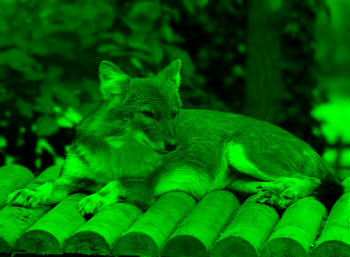

In [218]:
green_copy =  image.copy()
green_copy[:, :, 0] = 0
green_copy[:, :, 2] = 0
green_copy

array([[[ 0,  0, 89],
        [ 0,  0, 76],
        [ 0,  0, 61],
        ...,
        [ 0,  0, 86],
        [ 0,  0, 86],
        [ 0,  0, 86]],

       [[ 0,  0, 75],
        [ 0,  0, 68],
        [ 0,  0, 64],
        ...,
        [ 0,  0, 84],
        [ 0,  0, 84],
        [ 0,  0, 84]],

       [[ 0,  0, 66],
        [ 0,  0, 68],
        [ 0,  0, 74],
        ...,
        [ 0,  0, 82],
        [ 0,  0, 84],
        [ 0,  0, 85]],

       ...,

       [[ 0,  0, 10],
        [ 0,  0, 11],
        [ 0,  0, 14],
        ...,
        [ 0,  0, 67],
        [ 0,  0, 71],
        [ 0,  0, 67]],

       [[ 0,  0,  7],
        [ 0,  0, 10],
        [ 0,  0,  7],
        ...,
        [ 0,  0, 54],
        [ 0,  0, 58],
        [ 0,  0, 57]],

       [[ 0,  0, 30],
        [ 0,  0, 24],
        [ 0,  0, 14],
        ...,
        [ 0,  0, 51],
        [ 0,  0, 47],
        [ 0,  0, 70]]], dtype=uint8)
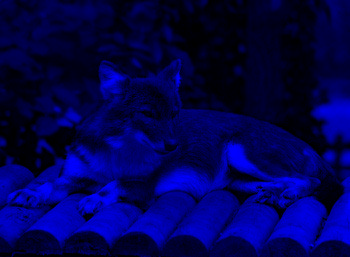

In [219]:
blue_copy =  image.copy()
blue_copy[:, :, 0] = 0
blue_copy[:, :, 1] = 0
blue_copy

In [220]:
# We transform the image into a tensor to manage better under a GPU
tensor_image = tf.constant(image)
tensor_image

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [221]:
# Define image size
IMG_SIZE = 224

def show_info(title, image, show):
  if show:
    print(title)
    if image.shape != (): print(image.shape)
    print(image)
    print()
    print()

def process_image(image_path, detailed_info=False):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # print(image_path)
  # print(detailed_info)

  # Read in an image file
  image = tf.io.read_file(image_path)
  show_info("Read in an image file", image, detailed_info)

  # Turn the jpeg image into numerical Tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  show_info("Turn the jpeg image into numerical Tensor with 3 colour channels (RGB)", image, detailed_info)

  # Convert the colour channel values from integer between (0, 255) to float between (0, 1) values (it is call normalization, more eficient)
  image = tf.image.convert_image_dtype(image, tf.float32)
  show_info("Normalization - Convert the colour channel values from integer between (0, 255) to float between (0, 1)", image, detailed_info)

  # Resize the image to our desired value
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  show_info("Resize the image to our desired value", image, detailed_info)

  return image

In [222]:
filenames[55]

'/content/drive/MyDrive/data/dog-breed-identification/train/0161847d5bfae154af084993fa26a1a7.jpg'

In [223]:
image_processed = process_image(filenames[55], True)

Read in an image file
tf.Tensor(b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01w\x01\xf4\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca\xd2\xd3\x

### Turning our data into batches
We use default size batches of 32, using bigger will consume a lot of memory

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples (image, label)

In [224]:
def get_image_label(image_path, label):
  """
  Takes an image file path name and label and return a (image, label) tuple
  """
  image = process_image(image_path)
  if isinstance(label, np.ndarray):
    label = tf.constant(label)
  return image, label

In [225]:
tensor_tuple = get_image_label(X[42], y[42])
print(tensor_tuple[0].shape)
print()
print(tensor_tuple)

(224, 224, 3)

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117759],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 

### Create a function to transform all information into batches

In [226]:
BATCH_SIZE = 32

# things will be donde differently depends on the type of data (training, validation or test)
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data= False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it/s training data but does not shuffle if it is validation data.
  Also accepts test data as input (no labels).
  """
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image)
  elif valid_data:
    print("Creating valid data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label)
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    # Shuffling
    data = data.shuffle(buffer_size=len(X))
    # Create tuples
    data_batch = data.map(get_image_label)

  # Turn info into batches
  # return data.batch(BATCH_SIZE)
  return data_batch.batch(batch_size)

In [227]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating valid data batches...


In [228]:
X_train[0]

'/content/drive/MyDrive/data/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg'

In [229]:
y_train[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [230]:
train_data, train_data.element_spec, val_data.element_spec

(<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>,
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing data batches

In [231]:
import matplotlib.pyplot as plt
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their lebeles from a data batch
  """
  plt.figure(figsize=(10, 10))
  for i in range(25):
    # create subplots (5rows, 5columns)
    ax = plt.subplot(5,5, i+1)
    # Display image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [232]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [233]:
train_images, train_labels = next(train_data.as_numpy_iterator())

In [234]:
train_images, train_labels

(array([[[[1.09803930e-01, 1.01960793e-01, 4.31372561e-02],
          [1.09803930e-01, 1.01960793e-01, 4.31372561e-02],
          [1.09803930e-01, 1.01960793e-01, 4.99399751e-02],
          ...,
          [2.08403364e-01, 1.61344528e-01, 1.06442571e-01],
          [2.12805107e-01, 1.65746272e-01, 1.10844314e-01],
          [2.16966763e-01, 1.69907928e-01, 1.15005963e-01]],
 
         [[1.05882362e-01, 1.01960793e-01, 2.52100863e-02],
          [1.05882362e-01, 1.01960793e-01, 2.52100863e-02],
          [1.05882362e-01, 1.01960793e-01, 2.52100863e-02],
          ...,
          [2.07683071e-01, 1.60624236e-01, 1.05722278e-01],
          [2.21608594e-01, 1.74549758e-01, 1.19647808e-01],
          [2.32212856e-01, 1.85154021e-01, 1.30252063e-01]],
 
         [[1.01960793e-01, 9.80392247e-02, 1.56862754e-02],
          [1.01960793e-01, 9.80392247e-02, 1.56862754e-02],
          [1.01960793e-01, 9.80392247e-02, 1.96078438e-02],
          ...,
          [2.18407378e-01, 1.71348542e-01, 1.1644

In [235]:
len(train_images), len(train_labels)

(32, 32)

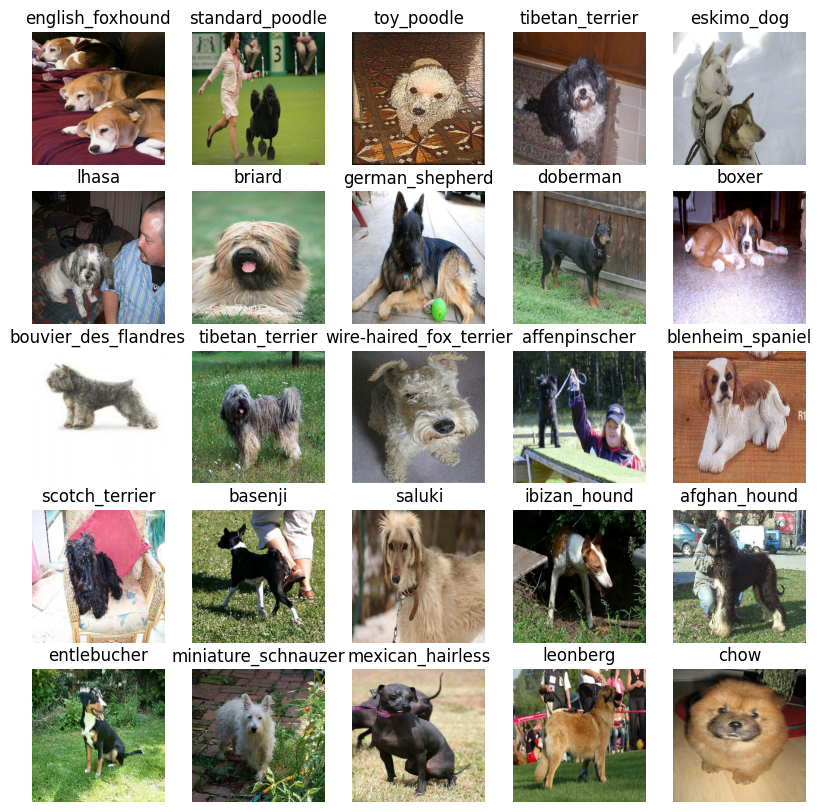

In [236]:
# Visualize the data in a training batch
show_25_images(train_images, train_labels)

## Building a model

Before we build a model, thjere are a few things we need to define:
1. The inputs shape (our images shape, in the form of Tensors) to our model.
2. The output shape (image labels, in the form of Tensors) of our model
3. The URL of the model we want to use is: "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [237]:
# Setup input
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, weidth, colour channels

# Setup input shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [238]:
# Our Output shape is 120, because we have 120 possibilities, this model has 1280 possible outputs, therefore we will fit using softmax
INPUT_SHAPE, OUTPUT_SHAPE, MODEL_URL

([None, 224, 224, 3],
 120,
 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4')

In [282]:
# def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
#   print(f"Build model with: {model_url}")

#   hubs_layer = hub.KerasLayer(MODEL_URL)

#   model = tf.keras.Sequential([
#     tf.keras.layers.Lambda(lambda x: hubs_layer(x)), # Layer 1 (input layer)
#     tf.keras.layers.Dense(units=OUTPUT_SHAPE,
#                           activation="softmax") # Layer 2 (output layer)
#   ])

#   # model = tf.keras.Sequential([
#   #     hub.KerasLayer(MODEL_URL),
#   #     tf.keras.layers.Dense(units=OUTPUT_SHAPE,
#   #                           activation="softmax")
#   # ])

#   model.compile(
#       loss=tf.keras.losses.CategoricalCrossentropy(),
#       optimizer=tf.keras.optimizers.Adam(),
#       metrics=["accuracy"]
#   )

#   model.build(INPUT_SHAPE)

#   return model

In [307]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("building with", model_url)
    # Setup the model layers

    model = tf.keras.Sequential([
        tf.keras.layers.Lambda(lambda x: hub.KerasLayer(MODEL_URL)(x)),
        tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation = "softmax") # Layer 2 (output layer)
        # tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation = "sigmoid") # Layer 2 (output layer)
    ])
    # compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        # loss=tf.keras.losses.BinaryCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )
    # build the model
    model.build(input_shape)
    return model

In [241]:
model = create_model(INPUT_SHAPE, OUTPUT_SHAPE, MODEL_URL)
model.summary()

building with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda_6 (Lambda)                    │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 120)                 │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progresss, check its progress as a dashboard (TensorBoard) or stop training early if a mode stops improving in certain evaluation metrics to avoid overfiting

1. First callback for TensorBoard
  
  a. Load TensorBoard extension

  b. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function
  
  c. Visualize our model training logs with the %tensorboard magic function (we will do this after model training)

2. Second callback for Early Stopping

In [242]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [243]:
import datetime
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make the log get tracked when running
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [244]:
# Create early stopping callvack
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [245]:
NUM_EPOCHES= 100 #@param {type:"slider", min:10, max:100, step:10}

In [246]:
# Check to make sure we are still running on a GPU
print ("GPU", tf.config.list_physical_devices("GPU"))

GPU []


Create a fucntion which trains our model
1. Create a model
2. Setup Tensorboard
2. Fit using NUM_EPOCH
3. Return trained model

In [247]:
def train_model():
  """
  Trains a given model and returns the trained version
  """
  #Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data, epochs=NUM_EPOCHES, validation_data=val_data, validation_freq=1, callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [248]:
model = train_model()

building with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 70s 2s/step - accuracy: 0.0551 - loss: 5.1692 - val_accuracy: 0.2550 - val_loss: 3.4382
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 76s 2s/step - accuracy: 0.5803 - loss: 1.9975 - val_accuracy: 0.5250 - val_loss: 2.1479
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - accuracy: 0.9189 - loss: 0.6518 - val_accuracy: 0.6150 - val_loss: 1.6325
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 0.9926 - loss: 0.2789 - val_accuracy: 0.6650 - val_loss: 1.4535
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - accuracy: 0.9992 - loss: 0.1629 - val_accuracy: 0.6900 - val_loss: 1.3724
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - accuracy: 0.9993 - loss: 0.1026 - val_accuracy: 0.6750 - val_loss: 1.3368
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 96s 3s/step - accuracy: 1.0000 - loss: 0.0760 - val_accuracy: 0.6650 - val_loss: 1.3096
Epoch 8/100
25/25 ━━━━━━━

Mainly because accuarcy is 1.0000 over training data and much lower score on validation data as val_accuracy 0.6850 we can say that our model is overfitting, but at the same time we can say  our model is learning. Overfitng to begin with is a good thing.

### Checkig the TensorBaord logs

The TensorBoard magic function ('%tensorboard') will access the logs directory we created earlier and visualize its contents

In [249]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [250]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step


array([[1.5973112e-03, 1.2011872e-04, 3.0042413e-03, ..., 5.3930416e-04,
        4.5339076e-04, 1.6822586e-03],
       [3.0966131e-03, 7.8512632e-05, 1.4685700e-02, ..., 7.0232170e-05,
        1.1557831e-03, 3.5725191e-04],
       [2.0072595e-05, 1.7697144e-04, 3.2875021e-05, ..., 6.4502456e-05,
        3.3930573e-04, 3.7956848e-05],
       ...,
       [1.8827790e-04, 3.6944638e-04, 1.0100767e-04, ..., 5.5436594e-05,
        6.2313169e-04, 1.4138744e-04],
       [4.2786663e-03, 7.0854445e-04, 3.9936817e-04, ..., 2.9901441e-04,
        6.5020336e-05, 6.2707649e-03],
       [7.9720863e-04, 4.8687416e-05, 1.0667316e-03, ..., 4.3483255e-03,
        1.3061160e-03, 2.0823709e-04]], dtype=float32)

In [251]:
predictions.shape

(200, 120)

In [252]:
len(predictions[0])

120

In [253]:
index = 0
predictions[index]

array([1.59731123e-03, 1.20118719e-04, 3.00424127e-03, 4.93105872e-05,
       3.33700678e-04, 1.79106391e-05, 8.58853161e-02, 1.49841141e-03,
       6.03797889e-05, 4.57964750e-04, 2.50852131e-03, 1.16047057e-04,
       1.00426236e-03, 9.74334907e-05, 7.50449617e-05, 9.39731544e-04,
       3.61091297e-05, 1.88197702e-01, 2.96657036e-05, 1.40851425e-05,
       8.89121962e-04, 3.70793889e-04, 1.03121500e-04, 1.33092189e-03,
       1.57676168e-05, 3.76528536e-04, 3.15666348e-01, 5.58078937e-05,
       3.74385709e-04, 1.52157189e-03, 2.68183212e-04, 1.53597863e-03,
       5.28322358e-04, 1.01221318e-04, 9.19154481e-05, 3.09242196e-02,
       2.46614081e-06, 2.53048982e-03, 7.09629385e-04, 8.31483630e-05,
       6.58763631e-04, 1.08730688e-04, 4.43924422e-04, 1.83792770e-04,
       9.15643068e-06, 5.45769057e-04, 3.48497597e-05, 3.79118166e-04,
       1.09611440e-03, 2.59117165e-04, 4.14827722e-04, 1.25898878e-05,
       7.40816293e-04, 5.78479121e-05, 7.80858536e-05, 5.48183925e-06,
      

In [254]:
# Probabilities over every single label (probabilities of each breeds base on the first image [0] using softmax as the layer in our model)
print(f"Probabilities sum: {np.sum(predictions[index])}")
print(f"Max probability value: {np.max(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print("Predicted label (breed): " + unique_breeds[np.argmax(predictions[index])])

Probabilities sum: 0.9999999403953552
Max probability value: 0.3156663477420807
Max index: 26
Predicted label (breed): cairn


We will do the same at scale and adding the image the prediction is being made on

In [255]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [256]:
get_pred_label(predictions[14])

'english_foxhound'

In [257]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Since our validation data is still in a batch dataset, we will have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation label (truth labels)

In [258]:
def unbatchify(batch_data):
  """
  Takes a batches dataset of (image, label) Tensor return separated arrays
  """
  images_ = []
  labels_ = []

  for image, label in val_data.unbatch().as_numpy_iterator():
    images_.append(image)
    # labels_.append(label)
    labels_.append(unique_breeds[np.argmax(label)])

  return images_, labels_

In [259]:
val_images, val_labels = unbatchify(val_data)

In this case our model did a prediction wrong "cairn" not equal to "border_terrier"

In [260]:
get_pred_label(val_labels[0])

'affenpinscher'

In [261]:
get_pred_label(predictions[0])

'cairn'

We will crete a function which takes an array prediction probabilities, an array of truth labels and an array of images and integers

In [262]:
from PIL import Image as Im
def plot_pred(prediction_probability, true_label, image):
  """
  View the prediction, ground truth and image for sample n
  """

  pred_label = get_pred_label(prediction_probability)

  show_real_image = False
  if pred_label == true_label:
    color = "green"
    title2 = ""
  else:
    color = "red"
    show_real_image = True
    title2 = "Spected (" + true_label + ")"

  plt.figure(figsize=(10, 5))
  plt.subplot(1, 2, 1)
  plt.imshow(image)
  plt.axis("off")
  title1 = "Predicted ({} {:2.0f}%)".format(pred_label, np.max(prediction_probability * 100))
  plt.title(title1, color=color)

  if show_real_image:
    drive = "/content/drive/MyDrive/data/dog-breed-identification/train/"
    name_selected = labels_csv.loc[labels_csv["breed"] == true_label, "id"].iloc[0]
    extension = ".jpg"

    plt.subplot(1, 2, 2)
    plt.imshow(Im.open(drive + name_selected + extension))
    plt.axis("off")
    plt.title(title2)

  plt.show()

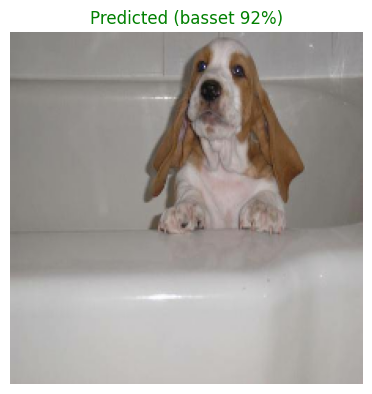

In [263]:
index_selected = 2
plot_pred(predictions[index_selected], val_labels[index_selected], val_images[index_selected])

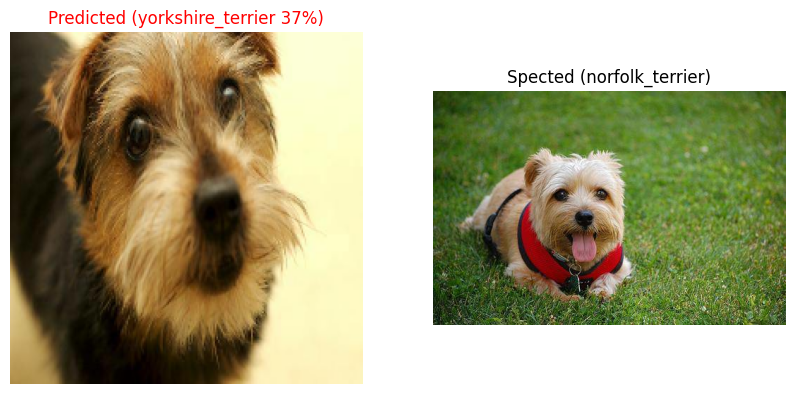

In [264]:
index_selected = 88
plot_pred(predictions[index_selected], val_labels[index_selected], val_images[index_selected])

## Show a plot with the 10 highest prediction confidences highlighting the spected one  

In [265]:
def plot_pred_conf(pred_prob, true_label):

  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  top_10_pred_values = pred_prob[top_10_pred_indexes]

  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

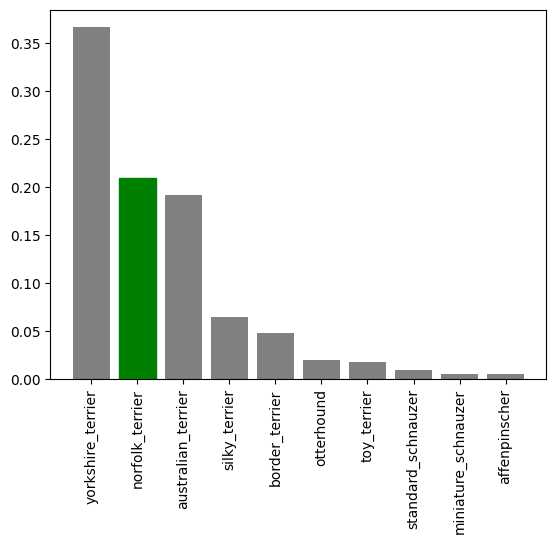

In [266]:
plot_pred_conf(predictions[index_selected], val_labels[index_selected])

## Check few predictions and their different values

In [267]:
def plot_pred2(prediction_probability, true_label, image):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_label = get_pred_label(prediction_probability)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(prediction_probability*100), true_label),color=color)

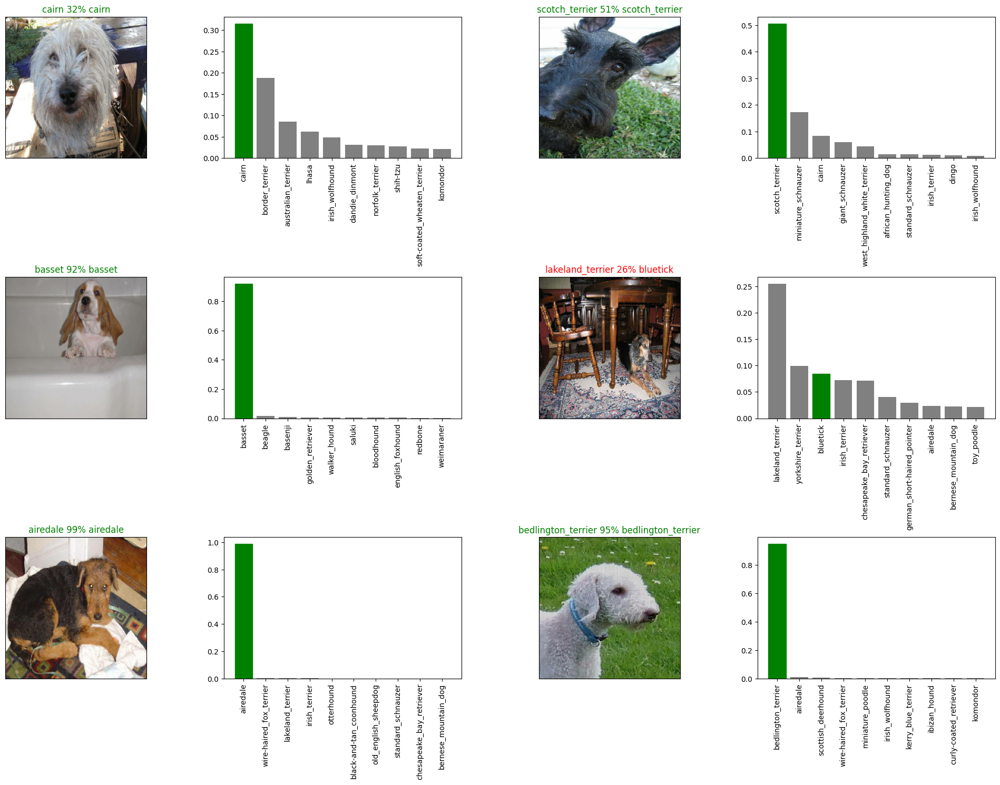

In [268]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize= (10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred2(predictions[i+i_multiplier],
            val_labels[i+i_multiplier],
            val_images[i+i_multiplier])
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions[i+i_multiplier],
                 val_labels[i+i_multiplier])
plt.tight_layout(h_pad = 1.0)
plt.show()

## Saving and reloading the model

In [269]:
# # Create a function to save a model
# def save_model(model, suffix=None):
#   """
#   Saves a given model in a models directory and appends a suffix (string)
#   """
#   modeldir = os.path.join("drive/MyDrive/Dog Vision/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
#   model_path = modeldir + "-" + suffix + ".keras"
#   # model_path = modeldir + "-" + suffix + ".h5"
#   print(f"Saving model to: {model_path}...")
#   model.save(model_path)
#   return model_path

In [287]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity.
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".keras" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [288]:
# # Create a function to load a trained model
# import keras
# def load_model(model_path):
#   """
#   Load a saved model from a specific path
#   """
#   print(f"Loading a saved model from: {model_path}...")
#   keras.config.enable_unsafe_deserialization()  # Allow lambda deserialization
#   model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer": hub.KerasLayer})
#   # model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
#   return model

In [289]:
# Create a function to load a trained model
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [272]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20250402-11341743593650-1000-images-mobilenetv2-Adam.keras...


'drive/MyDrive/Dog Vision/models/20250402-11341743593650-1000-images-mobilenetv2-Adam.keras'

In [290]:
# Load a train model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20250402-11341743593650-1000-images-mobilenetv2-Adam.keras")

Loading saved model from: drive/MyDrive/Dog Vision/models/20250402-11341743593650-1000-images-mobilenetv2-Adam.keras


In [276]:
# Evaluate the loaded model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - accuracy: 0.7019 - loss: 1.2216


[1.2821531295776367, 0.6899999976158142]

## Training a big dog model (on full data)

In [298]:
len(X), X[:5]

(10222,
 ['/content/drive/MyDrive/data/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
  '/content/drive/MyDrive/data/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
  '/content/drive/MyDrive/data/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
  '/content/drive/MyDrive/data/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
  '/content/drive/MyDrive/data/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg'])

In [294]:
len(X_train), X_train[:5]

(800,
 ['/content/drive/MyDrive/data/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/data/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/data/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/data/dog-breed-identification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/data/dog-breed-identification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'])

In [297]:
len(y), y[:1]

(10222,
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False])])

In [299]:
len(y_train), y_train[:1]

(800,
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False])])

In [300]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [301]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [308]:
full_model = create_model()

building with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [309]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [310]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHES,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 531s 2s/step - accuracy: 0.4882 - loss: 2.3770
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 553s 2s/step - accuracy: 0.8849 - loss: 0.3817
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 505s 2s/step - accuracy: 0.9410 - loss: 0.2249
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 571s 2s/step - accuracy: 0.9689 - loss: 0.1422
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 546s 2s/step - accuracy: 0.9830 - loss: 0.0965
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 527s 2s/step - accuracy: 0.9885 - loss: 0.0706
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 527s 2s/step - accuracy: 0.9917 - loss: 0.0560
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 559s 2s/step - accuracy: 0.9956 - loss: 0.0406
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 546s 2s/step - accuracy: 0.9966 - loss: 0.0346
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 570s 2s/step - accuracy: 0.9975 - loss: 0.0286
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 519s 2s/step - accuracy: 0.9974 - loss: 0.0245
Epoch 12/100
320/320 ━━━━━━━━━

In [311]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20250402-15001743606031-full-image-set-mobilenetv2-Adam.keras...


'drive/MyDrive/Dog Vision/models/20250402-15001743606031-full-image-set-mobilenetv2-Adam.keras'

## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we will have to get it into the same format

Luckily we created 'create_data_batches()' earlier which can take a list of filenames as input and conver them into Tensor batches.

1. Get the test filenames
2. Convert the filenames into test data batches (without labels)
3. Make a predictions array by passing the test batches to predcit method

In [312]:
test_path = "/content/drive/MyDrive/data/dog-breed-identification/test"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/data/dog-breed-identification/testdf69bb4b3dbdc81541e2bd70a5f35cb1.jpg',
 '/content/drive/MyDrive/data/dog-breed-identification/testdd8d95720349f85d2a795adaafc71172.jpg',
 '/content/drive/MyDrive/data/dog-breed-identification/teste6e8ae7dc0e71c6ae868fd3371fde010.jpg',
 '/content/drive/MyDrive/data/dog-breed-identification/teste2c0a9f66153b81eb27bb1bceb8c18dd.jpg',
 '/content/drive/MyDrive/data/dog-breed-identification/testdf58b248e14af15c43fb4a3ebc00e9a3.jpg',
 '/content/drive/MyDrive/data/dog-breed-identification/teste7a1b7a42db97df750aeae212a02d9c4.jpg',
 '/content/drive/MyDrive/data/dog-breed-identification/teste383a31009f0779536d43816c10bf662.jpg',
 '/content/drive/MyDrive/data/dog-breed-identification/teste0d85c8c8730c81e80ff2ca74bb61c87.jpg',
 '/content/drive/MyDrive/data/dog-breed-identification/teste061b8d24e7b1324a6ac92ae81fdda19.jpg',
 '/content/drive/MyDrive/data/dog-breed-identification/teste715a411098c046cac90c3facfa58c77.jpg']

In [313]:
len(test_filenames)

10357

In [314]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [315]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = full_model.predict(test_data, verbose=1)

In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

## Making predictions on custom images

1. Create filepath with our custom images
2. Turn them into tensor and group by batches
3. Pass these batches throught predict method
4. Convert output predictions into predictions labels
5. Compare the predicted labels to the custom images

In [328]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Dog Vision/random-dog-photo/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['/content/drive/MyDrive/Dog Vision/random-dog-photo/KOA_Nassau_2697x1517.jpg',
 '/content/drive/MyDrive/Dog Vision/random-dog-photo/your-dog.jpg',
 '/content/drive/MyDrive/Dog Vision/random-dog-photo/signs-of-a-healthy-dog-800x500.jpg']

In [329]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [330]:
# Make predictions on the custom data (I use model instead of full_model)
custom_preds = model.predict(custom_data)
custom_preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


array([[4.38001043e-05, 2.64945813e-03, 9.89616638e-06, 1.14906579e-04,
        9.72515903e-04, 1.03661347e-04, 1.58211496e-05, 8.47326955e-05,
        8.00038033e-05, 6.44914631e-04, 5.44627728e-05, 2.19549984e-03,
        3.66730266e-04, 2.87449395e-04, 4.19675140e-04, 2.34609670e-05,
        9.49867594e-04, 4.71445732e-03, 1.24318540e-04, 6.73133763e-05,
        5.55417246e-05, 9.56170479e-05, 2.16898843e-05, 8.83415982e-04,
        2.78299721e-03, 3.83724109e-03, 2.96962990e-05, 6.72954047e-05,
        1.68493111e-02, 7.93056970e-05, 1.01579214e-03, 1.27628027e-03,
        1.07443433e-04, 5.04724681e-04, 6.34524215e-04, 7.62243435e-05,
        2.40488898e-05, 3.10071348e-03, 6.07966758e-05, 1.58938684e-03,
        7.83557829e-04, 1.49171727e-04, 2.07575227e-04, 5.99643856e-04,
        7.64599489e-03, 4.97117207e-06, 4.65239864e-04, 5.72812860e-04,
        1.74520697e-04, 7.80074835e-01, 7.04623890e-05, 2.73523910e-04,
        1.38277560e-02, 5.18510169e-05, 8.55894352e-04, 2.947962

In [331]:
# 120 probabilities for each photo
custom_preds.shape

(3, 120)

In [332]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'boxer', 'miniature_poodle']

In [333]:
# Get custom images using unbatchify() function will not work since there are not labels...
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

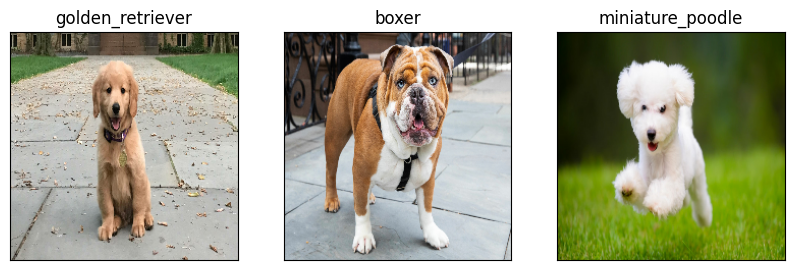

In [334]:
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)